## Generate volumn point clouds

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to generate points for a sphere
def generate_sphere(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.random.uniform(0, np.pi, num_points)
    radius = np.random.uniform(0, 1, num_points)
    x = radius * np.sin(phi) * np.cos(theta)
    y = radius * np.sin(phi) * np.sin(theta)
    z = radius * np.cos(phi)
    return x, y, z

# Function to generate points for a cube
def generate_cube(num_points):
    points = np.random.uniform(-0.5, 0.5, (num_points, 3))
    return points[:, 0], points[:, 1], points[:, 2]

# Function to generate points for a cylinder
def generate_cylinder(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    height = np.random.uniform(-0.5, 0.5, num_points)
    radius = np.random.uniform(0, 0.5, num_points)
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    z = height
    return x, y, z

# Function to generate points for a torus
def generate_torus(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.random.uniform(0, 2 * np.pi, num_points)
    major_radius = np.random.uniform(0.2, 0.5, num_points)
    minor_radius = np.random.uniform(0.05, 0.1, num_points)
    x = (major_radius + minor_radius * np.cos(phi)) * np.cos(theta)
    y = (major_radius + minor_radius * np.cos(phi)) * np.sin(theta)
    z = minor_radius * np.sin(phi)
    return x, y, z

# Function to generate points for a pyramid
def generate_pyramid(num_points):
    x = np.random.uniform(-0.5, 0.5, num_points)
    y = np.random.uniform(-0.5, 0.5, num_points)
    z = np.random.uniform(0, 1, num_points) * (0.5 - np.abs(x)) * (0.5 - np.abs(y))
    return x, y, z

# Function to generate points for a spiral
def generate_spiral(num_points):
    theta = np.linspace(0, 6 * np.pi, num_points)
    radius = np.linspace(0.1, 1, num_points)
    x = radius * np.cos(theta) + 0.1 * np.random.normal(size=num_points)
    y = radius * np.sin(theta) + 0.1 * np.random.normal(size=num_points)
    z = np.linspace(0, 2, num_points) + 0.1 * np.random.normal(size=num_points)
    return x, y, z

# Function to generate points for a Torus Knot shape
def generate_torus_knot(num_points, spread=0.1):
    p = 1  # Torus knot parameter
    q = 1  # Torus knot parameter
    theta = np.linspace(0, 2 * np.pi, num_points)
    phi = p * theta
    x_curve = (1 + np.cos(q * phi)) * np.cos(theta)
    y_curve = (1 + np.cos(q * phi)) * np.sin(theta)
    z_curve = np.sin(q * phi)

    x_cloud = x_curve + spread * np.random.normal(size=num_points)
    y_cloud = y_curve + spread * np.random.normal(size=num_points)
    z_cloud = z_curve + spread * np.random.normal(size=num_points)

    return x_cloud, y_cloud, z_cloud

# Function to generate points for a Double Cone shape
def generate_double_cone(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    height = np.random.uniform(-1, 1, num_points)
    radius = 1 - np.abs(height)  # Cone radius varies with height
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    z = height
    return x, y, z


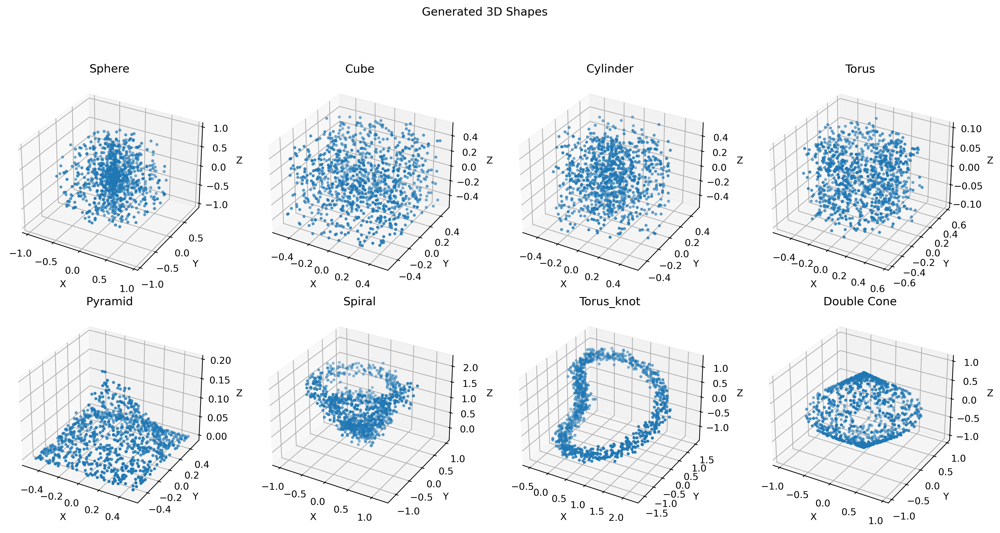

In [30]:
# Set the number of points for each shape
num_points = 1000

# Create a figure with subplots
fig = plt.figure(figsize=(15, 8),  dpi=300)
fig.suptitle('Generated 3D Shapes')

# Generate and plot the shapes in separate subfigures
shapes = [
    ('Sphere', generate_sphere),
    ('Cube', generate_cube),
    ('Cylinder', generate_cylinder),
    ('Torus', generate_torus),
    ('Pyramid', generate_pyramid),
    ('Spiral', generate_spiral),
    ('Torus_knot', generate_torus_knot),
    ('Double Cone', generate_double_cone)
]

for i, (shape_name, shape_generator) in enumerate(shapes):
    ax = fig.add_subplot(2, 4, i + 1, projection='3d')
    x, y, z = shape_generator(num_points)
    ax.scatter(x, y, z, marker='.')
    ax.set_title(shape_name)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

# Adjust layout and show the plot
plt.tight_layout(pad=3)
plt.subplots_adjust(top=0.85)
plt.show()

## Generate surface point clouds

In [59]:
import numpy as np

# Function to generate points on the surface of a sphere
def generate_sphere_surface(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.arccos(2 * np.random.uniform(0, 1, num_points) - 1)
    x = np.sin(phi) * np.cos(theta)
    y = np.sin(phi) * np.sin(theta)
    z = np.cos(phi)
    return x, y, z

# Function to generate points on the surface of a cube
def generate_cube_surface(num_points):
    # Generate points on the faces of the cube and then project them to the surface
    points = np.random.uniform(-0.5, 0.5, (num_points, 3))
    idx = np.random.randint(6, size=num_points)
    face_mapping = [
        lambda p: [p[0], p[1], 0.5],  # Top face
        lambda p: [p[0], p[1], -0.5],  # Bottom face
        lambda p: [p[0], 0.5, p[2]],  # Front face
        lambda p: [p[0], -0.5, p[2]],  # Back face
        lambda p: [0.5, p[1], p[2]],  # Right face
        lambda p: [-0.5, p[1], p[2]]   # Left face
    ]
    points = np.array([face_mapping[i](point) for i, point in zip(idx, points)])
    return points[:, 0], points[:, 1], points[:, 2]

# Function to generate points on the surface of a cylinder
def generate_cylinder_surface(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    height = np.random.uniform(-0.5, 0.5, num_points)
    x = np.cos(theta)
    y = np.sin(theta)
    z = height
    return x, y, z

# Function to generate points on the surface of a torus
def generate_torus_surface(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.random.uniform(0, 2 * np.pi, num_points)
    major_radius = 0.35  # Fixed major radius for consistency
    minor_radius = 0.1   # Fixed minor radius for consistency
    x = (major_radius + minor_radius * np.cos(phi)) * np.cos(theta)
    y = (major_radius + minor_radius * np.cos(phi)) * np.sin(theta)
    z = minor_radius * np.sin(phi)
    return x, y, z

# Function to generate points on the surface of a pyramid
def generate_pyramid_surface(num_points):
    # Generate points on the surface of the pyramid
    u = np.random.uniform(-0.5, 0.5, num_points)
    v = np.random.uniform(-0.5, 0.5, num_points)
    z = 1 - np.abs(u) - np.abs(v)
    return u, v, z

# Function to generate points on the surface of a Double Cone shape
def generate_double_cone_surface(num_points):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    height = np.random.uniform(-1, 1, num_points)
    radius = 1 - np.abs(height)  # Cone radius varies with height
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    z = height
    return x, y, z

# Function to generate points on the surface of a spiral
def generate_spiral_surface(num_points):
    theta = np.linspace(0, 6 * np.pi, num_points)
    radius = np.linspace(0.1, 1, num_points)
    x = radius * np.cos(theta) + 0.1 * np.random.normal(size=num_points)
    y = radius * np.sin(theta) + 0.1 * np.random.normal(size=num_points)
    z = np.linspace(0, 2, num_points) + 0.1 * np.random.normal(size=num_points)
    return x, y, z

# Function to generate points on the surface of a Torus Knot shape
def generate_torus_knot_surface(num_points, spread=0.1):
    p = 1  # Torus knot parameter
    q = 1  # Torus knot parameter
    theta = np.linspace(0, 2 * np.pi, num_points)
    phi = p * theta
    x_curve = (1 + np.cos(q * phi)) * np.cos(theta)
    y_curve = (1 + np.cos(q * phi)) * np.sin(theta)
    z_curve = np.sin(q * phi)

    x_cloud = x_curve + spread * np.random.normal(size=num_points)
    y_cloud = y_curve + spread * np.random.normal(size=num_points)
    z_cloud = z_curve + spread * np.random.normal(size=num_points)

    return x_cloud, y_cloud, z_cloud


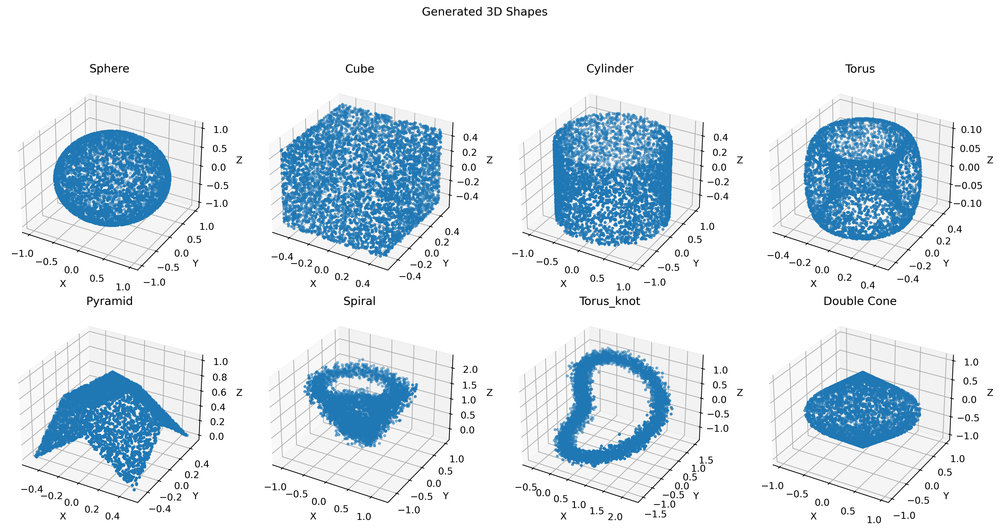

In [142]:
# Set the number of points for each shape
num_points = 5000

# Create a figure with subplots
fig = plt.figure(figsize=(15, 8),  dpi=300)
fig.suptitle('Generated 3D Shapes')

# Generate and plot the shapes in separate subfigures
shapes = [
    ('Sphere', generate_sphere_surface),
    ('Cube', generate_cube_surface),
    ('Cylinder', generate_cylinder_surface),
    ('Torus', generate_torus_surface),
    ('Pyramid', generate_pyramid_surface),
    ('Spiral', generate_spiral_surface),
    ('Torus_knot', generate_torus_knot_surface),
    ('Double Cone', generate_double_cone_surface)
]

for i, (shape_name, shape_generator) in enumerate(shapes):
    ax = fig.add_subplot(2, 4, i + 1, projection='3d')
    x, y, z = shape_generator(num_points)
    ax.scatter(x, y, z, marker='.')
    ax.set_title(shape_name)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(elev=30, azim=-60)

# Adjust layout and show the plot
plt.tight_layout(pad=3)
plt.subplots_adjust(top=0.85)
plt.show()

## Generate with cutomized parameters

In [110]:
# Function to generate points on the surface of an ellipse-like shape
def generate_ellipse_surface(num_points, length=3, width=1):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.random.uniform(0, np.pi, num_points)
    x = length * np.sin(phi) * np.cos(theta)
    y = width * np.sin(phi) * np.sin(theta)
    z = np.cos(phi)
    
    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x, y, z)

    return x_rotated, y_rotated, z_rotated

# Function to generate points on the surface of a cube with customizable dimensions
def generate_scaled_cube_surface(num_points, length=3, width=2, height=1):
    # Generate points on the faces of the cube and then project them to the surface
    points = np.random.uniform(-0.5, 0.5, (num_points, 3))
    idx = np.random.randint(6, size=num_points)
    face_mapping = [
        lambda p: [p[0], p[1], 0.5],  # Top face
        lambda p: [p[0], p[1], -0.5],  # Bottom face
        lambda p: [p[0], 0.5, p[2]],  # Front face
        lambda p: [p[0], -0.5, p[2]],  # Back face
        lambda p: [0.5, p[1], p[2]],  # Right face
        lambda p: [-0.5, p[1], p[2]]   # Left face
    ]
    points = np.array([face_mapping[i](point) for i, point in zip(idx, points)])

    # Scale the points based on the provided dimensions
    points[:, 0] *= length
    points[:, 1] *= width
    points[:, 2] *= height

    # return points[:, 0], points[:, 1], points[:, 2]

    x_rotated, y_rotated, z_rotated = rotate_point_cloud(points[:, 0], points[:, 1], points[:, 2])

    return x_rotated, y_rotated, z_rotated

# Function to generate points on the surface of an ellipse-like cylinder
def generate_ellipse_cylinder_surface(num_points, length=2, width=6, height=1):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    v = np.random.uniform(-1, 1, num_points)
    x_cloud = length * np.cos(theta)
    y_cloud = width * np.sin(theta)
    z_cloud = height * v
    
    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x_cloud, y_cloud, z_cloud)

    return x_rotated, y_rotated, z_rotated

def generate_custom_torus_surface(num_points, major_radius=0.5, minor_radius=0.1, ellipse_factor=3):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    phi = np.random.uniform(0, 2 * np.pi, num_points)
    x_cloud = (major_radius + ellipse_factor * minor_radius * np.cos(phi)) * np.cos(theta)
    y_cloud = (major_radius + minor_radius * np.cos(phi)) * np.sin(theta)
    z_cloud = minor_radius * np.sin(phi)
    
    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x_cloud, y_cloud, z_cloud)

    return x_rotated, y_rotated, z_rotated
# Function to generate points on the surface of a customizable pyramid
def generate_custom_pyramid_surface(num_points, base_length=3, base_width=2, height=5):
    x = np.random.uniform(-0.5, 0.5, num_points)
    y = np.random.uniform(-0.5, 0.5, num_points)
    # z = np.random.uniform(0, 1, num_points) * height * (0.5 - np.abs(x / base_length)) * (0.5 - np.abs(y / base_width))
    z = height - np.abs(x) - np.abs(y)
    # return x * base_length, y * base_width, z

    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x * base_length, y * base_width, z)

    return x_rotated, y_rotated, z_rotated

# Function to generate points on the surface of a customizable spiral
def generate_custom_spiral_surface(num_points, num_turns=3, radius_start=0.1, radius_end=5, height_start=0, height_end=2, spread=0.1):
    theta = np.linspace(0, num_turns * 2 * np.pi, num_points)
    radius = np.linspace(radius_start, radius_end, num_points)
    height = np.linspace(height_start, height_end, num_points)
    
    x_cloud = radius * np.cos(theta) + spread * np.random.normal(size=num_points)
    y_cloud = radius * np.sin(theta) + spread * np.random.normal(size=num_points)
    z_cloud = height + spread * np.random.normal(size=num_points)
    
    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x_cloud, y_cloud, z_cloud)

    return x_rotated, y_rotated, z_rotated

# Function to generate points on the surface of a stretched torus knot
def generate_stretched_torus_knot_surface(num_points, p = 2, q = 1, stretch_x=3, stretch_y=2, stretch_z=1, radius=0.3, spread=0.1):
    # theta = np.linspace(0, 2 * np.pi, num_points)
    # phi = theta  # Keep p and q as 1
    # x_curve = (1 + np.cos(phi)) * np.cos(theta)
    # y_curve = (1 + np.cos(phi)) * np.sin(theta)
    # z_curve = np.sin(phi)

    theta = np.linspace(0, 2 * np.pi, num_points)
    phi = p * theta
    x_curve = (1 + np.cos(q * phi)) * np.cos(theta)
    y_curve = (1 + np.cos(q * phi)) * np.sin(theta)
    z_curve = np.sin(q * phi)

    x_cloud = x_curve * stretch_x * radius + spread * np.random.normal(size=num_points)
    y_cloud = y_curve * stretch_y * radius + spread * np.random.normal(size=num_points)
    z_cloud = z_curve * stretch_z + spread * np.random.normal(size=num_points)

    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x_cloud, y_cloud, z_cloud)

    return x_rotated, y_rotated, z_rotated

# Function to generate points on the surface of a customizable double cone with modified circle dimensions
def generate_custom_double_cone_surface(num_points, base_length=0.6, base_width=0.3, top_length=6, top_width=3, height=1, spread=0.1):
    theta = np.random.uniform(0, 2 * np.pi, num_points)
    u = np.random.uniform(-1, 1, num_points)
    x_circle = np.cos(theta)
    y_circle = np.sin(theta)
    radius = np.sqrt((1 - np.abs(u)) * (top_width**2 - base_width**2) + base_width**2)
    x_cloud = radius * x_circle
    y_cloud = radius * y_circle
    z_cloud = height * u

    x_rotated, y_rotated, z_rotated = rotate_point_cloud(x_cloud, y_cloud, z_cloud)

    return x_rotated, y_rotated, z_rotated

In [143]:
def rotate_point_cloud(x_cloud, y_cloud, z_cloud):
    point_cloud = np.vstack((x_cloud, y_cloud, z_cloud)).T

    angle_x = np.random.uniform(0, 2 * np.pi)
    angle_y = np.random.uniform(0, 2 * np.pi)
    angle_z = np.random.uniform(0, 2 * np.pi)

    rotation_matrix_x = np.array([[1, 0, 0],
                                  [0, np.cos(angle_x), -np.sin(angle_x)],
                                  [0, np.sin(angle_x), np.cos(angle_x)]])
    
    rotation_matrix_y = np.array([[np.cos(angle_y), 0, np.sin(angle_y)],
                                  [0, 1, 0],
                                  [-np.sin(angle_y), 0, np.cos(angle_y)]])
    
    rotation_matrix_z = np.array([[np.cos(angle_z), -np.sin(angle_z), 0],
                                  [np.sin(angle_z), np.cos(angle_z), 0],
                                  [0, 0, 1]])
    
    rotation_matrix = np.dot(np.dot(rotation_matrix_x, rotation_matrix_y), rotation_matrix_z)
    rotated_point_cloud = np.dot(point_cloud, rotation_matrix.T)

    x_rotated = rotated_point_cloud[:, 0]
    y_rotated = rotated_point_cloud[:, 1]
    z_rotated = rotated_point_cloud[:, 2]
    
    return x_rotated, y_rotated, z_rotated



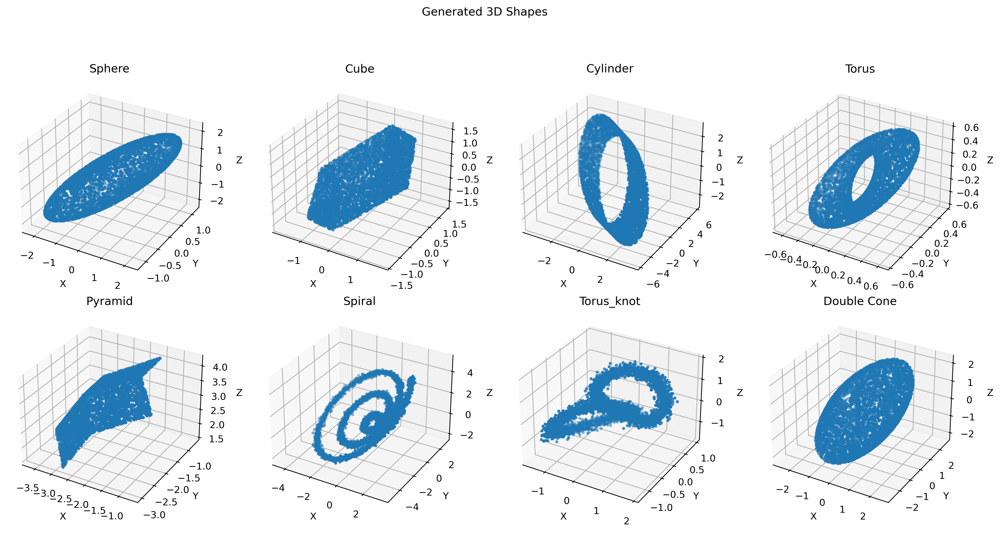

In [111]:
# Set the number of points for each shape
num_points = 5000

# Create a figure with subplots
fig = plt.figure(figsize=(15, 8),  dpi=300)
fig.suptitle('Generated 3D Shapes')

# Generate and plot the shapes in separate subfigures
shapes = [
    ('Sphere', generate_ellipse_surface),
    ('Cube', generate_scaled_cube_surface),
    ('Cylinder', generate_ellipse_cylinder_surface),
    ('Torus', generate_custom_torus_surface),
    ('Pyramid', generate_custom_pyramid_surface),
    ('Spiral', generate_custom_spiral_surface),
    ('Torus_knot', generate_stretched_torus_knot_surface),
    ('Double Cone', generate_custom_double_cone_surface)
]

for i, (shape_name, shape_generator) in enumerate(shapes):
    ax = fig.add_subplot(2, 4, i + 1, projection='3d')
    x, y, z = shape_generator(num_points)
    ax.scatter(x, y, z, marker='.')
    ax.set_title(shape_name)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

# Adjust layout and show the plot
plt.tight_layout(pad=3)
plt.subplots_adjust(top=0.85)
plt.show()

## Create Dataset

In [121]:
import random

def save_point_cloud_to_off(filename, points):
    with open(filename, 'w') as f:
        num_points = points.shape[0]
        f.write("OFF\n")
        f.write(f"{num_points} 0 0\n")  # num_points, num_faces, num_edges
        
        for point in points:
            f.write(f"{point[0]} {point[1]} {point[2]}\n")

In [118]:
numTrainVal = 500
numTest = 200

# num_points = 5000

datasetName = 'AbstractGeometries'
datasetPath = '/Users/liujunyu/Data/Research/BVC/starter/' + datasetName + '/'
if not os.path.exists(datasetPath):
    os.makedirs(datasetPath)

In [145]:
className = 'sphere'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    length = np.random.uniform(1, 10)
    width = np.random.uniform(1, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_ellipse_surface(num_points, length, width)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [146]:
className = 'cube'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    length = np.random.uniform(1, 10)
    width = np.random.uniform(1, 10)
    height = np.random.uniform(1, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_scaled_cube_surface(num_points, length, width, height)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [147]:
className = 'cylinder'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    length = np.random.uniform(1, 10)
    width = np.random.uniform(1, 10)
    height = np.random.uniform(1, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_ellipse_cylinder_surface(num_points, length, width, height)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [148]:
className = 'torus'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    major_radius = np.random.uniform(7, 10)
    minor_radius = np.random.uniform(2, 5)
    ellipse_factor = np.random.uniform(1, 5)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_custom_torus_surface(num_points, major_radius, minor_radius)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [149]:
className = 'pyramid'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    base_length = np.random.uniform(2, 10)
    base_width = np.random.uniform(2, 10)
    height = np.random.uniform(2, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_custom_pyramid_surface(num_points, base_length, base_width, height)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [150]:
className = 'spiral'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    num_turns = random.randint(2,5)
    radius_start = np.random.uniform(1, 4)
    radius_end = np.random.uniform(5, 10)
    height_start = np.random.uniform(1, 3)
    height_end = np.random.uniform(5, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_custom_spiral_surface(num_points, num_turns, radius_start, radius_end, height_start, height_end)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [151]:
className = 'torusKnot'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    p = 1
    q = 1
    stretch_x = np.random.uniform(1, 5)
    stretch_y = np.random.uniform(1, 5)
    stretch_z = np.random.uniform(1, 5)
    radius = np.random.uniform(2, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_stretched_torus_knot_surface(num_points, p, q, stretch_x, stretch_y, stretch_z, radius)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

In [152]:
className = 'doubleCone'

trainPath = datasetPath + className + '/train/'
testPath = datasetPath + className + '/test/'
if not os.path.exists(trainPath):
    os.makedirs(trainPath)
if not os.path.exists(testPath):
    os.makedirs(testPath)

for i in range(numTrainVal + numTest):
    base_length = np.random.uniform(1, 4)
    base_width = np.random.uniform(1, 4)
    top_length = np.random.uniform(5, 10)
    top_width = np.random.uniform(5, 10)
    height = np.random.uniform(2, 10)
    num_points = random.randint(4000, 8000)

    x,y,z = generate_custom_double_cone_surface(num_points, base_length, base_width, top_length, top_width, height)
    points = np.vstack((x, y, z)).T

    if i < numTrainVal:
        filename = trainPath + className + '_' + str(i) + '.off'
    else:
        filename = testPath + className + '_' + str(i) + '.off'
    save_point_cloud_to_off(filename, points)

## Store in files

In [8]:
def save_point_cloud_to_obj(filename, points):
    with open(filename, 'w') as f:
        for p in points.T:
            f.write(f'v {p[0]} {p[1]} {p[2]}\n')

In [48]:
import os

sampleShapePath = 'sampleShapes/'
if not os.path.exists(sampleShapePath):
    os.mkdir(sampleShapePath)

for i, (shape_name, shape_generator) in enumerate(shapes):
    x, y, z = shape_generator(num_points)
    points = np.vstack((x, y, z))
    save_point_cloud_to_obj(sampleShapePath + shape_name + '.obj', points)